# 椎体部位ごとのスライス画像探索的分析 (EDA)

このノートブックでは、椎体レベル(T4~L5)ごとにスライス画像をサンプリングして可視化します。

## 目的
- 各椎体部位(T4, T5, T6, ..., L5)でスライス画像がどのように表示されているか確認
- 3方向(axial, coronal, sagittal)での画像品質確認
- 骨折マスクの可視化
- 椎体部位による画像特性の違いを理解

## データ構造
```
data/slice_train/
├── axial/{patient_id}/{vertebra_id}/slice_XXX.nii
├── axial_mask/{patient_id}/{vertebra_id}/mask_XXX.nii
├── coronal/...
├── coronal_mask/...
├── sagittal/...
└── sagittal_mask/...
```

## 椎体ID → 解剖学的名称マッピング
T4~L5の椎体を対象としています(椎体ID: 27~31など)

## 1. セットアップ

In [1]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from pathlib import Path
from collections import defaultdict
import pandas as pd
from typing import Dict, List, Tuple, Optional
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# 日本語フォント設定
import matplotlib.font_manager as fm
noto_font_path = Path("/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc")
if noto_font_path.exists():
    fm.fontManager.addfont(str(noto_font_path))
    plt.rcParams['font.sans-serif'] = ['Noto Sans CJK JP'] + plt.rcParams['font.sans-serif']
else:
    try:
        import japanize_matplotlib
    except ImportError:
        print("⚠️ 日本語フォントが見つかりません")

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['figure.dpi'] = 100

# プロジェクトルートの設定
PROJECT_ROOT = Path().resolve().parent.parent
SLICE_TRAIN = PROJECT_ROOT / "data/slice_train"
SLICE_TEST = PROJECT_ROOT / "data/slice_test"

print(f"✅ セットアップ完了")
print(f"Training data: {SLICE_TRAIN}")
print(f"Test data: {SLICE_TEST}")

✅ セットアップ完了
Training data: /mnt/nfs1/home/yamamoto-hiroto/research/vertebrae_saka/data/slice_train
Test data: /mnt/nfs1/home/yamamoto-hiroto/research/vertebrae_saka/data/slice_test


## 2. 椎体ID → 解剖学的名称のマッピング構築

In [2]:
# 椎体IDの全リストを取得
def get_all_vertebra_ids(data_dir: Path, direction: str = "axial") -> List[str]:
    """データセット内のすべての椎体IDを取得"""
    vertebra_ids = set()
    
    dir_path = data_dir / direction
    if not dir_path.exists():
        return []
    
    for patient_dir in dir_path.iterdir():
        if patient_dir.is_dir():
            for vertebra_dir in patient_dir.iterdir():
                if vertebra_dir.is_dir():
                    vertebra_ids.add(vertebra_dir.name)
    
    return sorted(list(vertebra_ids), key=lambda x: int(x) if x.isdigit() else 999)

# 椎体IDリストの取得
all_vertebra_ids = get_all_vertebra_ids(SLICE_TRAIN)
print(f"検出された椎体ID: {all_vertebra_ids}")

# 椎体番号 → 解剖学的名称のマッピング
# データセットの椎体ID 27~40 が T4~L5 に対応
# T4~L5は全部で14個の椎体: T4, T5, T6, T7, T8, T9, T10, T11, T12, L1, L2, L3, L4, L5
# 椎体ID 27 = T4, 椎体ID 28 = T5, ..., 椎体ID 38 = T12, L1 = 39, ..., L5 = 40

def create_vertebra_mapping(vertebra_ids: List[str]) -> Dict[str, str]:
    """
    椎体ID → 解剖学的名称のマッピングを作成
    
    データセット固有のマッピング:
    - ID 27~38: T4~T12 (胸椎)
    - ID 39~40: L1~L2 (腰椎)
    
    しかし、実際のデータに応じて調整が必要
    データに14個の椎体がある場合、T4~L5 (14個) にマッピング
    """
    mapping = {}
    
    # 数値IDのみをソート
    numeric_ids = [vid for vid in vertebra_ids if vid.isdigit()]
    numeric_ids_sorted = sorted(numeric_ids, key=lambda x: int(x))
    
    # T4~L5の名称リスト (14個)
    vertebra_names = [
        'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'T10', 'T11', 'T12',
        'L1', 'L2', 'L3', 'L4', 'L5'
    ]
    
    # データセットの椎体数に応じてマッピング
    for idx, vid in enumerate(numeric_ids_sorted):
        if idx < len(vertebra_names):
            mapping[vid] = vertebra_names[idx]
        else:
            mapping[vid] = f"Unknown_{vid}"
    
    # 非数値IDはそのまま
    for vid in vertebra_ids:
        if not vid.isdigit():
            mapping[vid] = vid
    
    return mapping

VERTEBRA_MAPPING = create_vertebra_mapping(all_vertebra_ids)

print("\n【椎体IDマッピング】")
for vid, name in VERTEBRA_MAPPING.items():
    print(f"  {vid} → {name}")

# すべての椎体IDを対象とする
TARGET_VERTEBRA_IDS = sorted([vid for vid in all_vertebra_ids if vid.isdigit()], 
                             key=lambda x: int(x))

print(f"\n対象椎体ID: {TARGET_VERTEBRA_IDS}")
print(f"対象椎体名: {[VERTEBRA_MAPPING[vid] for vid in TARGET_VERTEBRA_IDS]}")

検出された椎体ID: ['27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

【椎体IDマッピング】
  27 → T4
  28 → T5
  29 → T6
  30 → T7
  31 → T8
  32 → T9
  33 → T10
  34 → T11
  35 → T12
  36 → L1
  37 → L2
  38 → L3
  39 → L4
  40 → L5

対象椎体ID: ['27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']
対象椎体名: ['T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'T10', 'T11', 'T12', 'L1', 'L2', 'L3', 'L4', 'L5']


## 3. ユーティリティ関数

In [3]:
# HU値のウィンドウレベル設定
HU_PRESETS = {
    "bone": {"center": 400, "width": 1500, "name": "骨条件"},
    "soft_tissue": {"center": 40, "width": 400, "name": "軟部組織"},
}

DIRECTIONS = ["axial", "coronal", "sagittal"]
DIRECTION_NAMES_JP = {
    "axial": "横断面",
    "coronal": "冠状断",
    "sagittal": "矢状断"
}

def apply_hu_window(image: np.ndarray, center: float, width: float) -> np.ndarray:
    """HU値にウィンドウレベルを適用"""
    min_hu = center - width / 2
    max_hu = center + width / 2
    windowed = np.clip(image, min_hu, max_hu)
    normalized = (windowed - min_hu) / (max_hu - min_hu) * 255
    return normalized.astype(np.uint8)

def load_nifti_slice(nifti_path: Path) -> np.ndarray:
    """NIFTI形式のスライス画像を読み込む"""
    img = nib.load(str(nifti_path))
    data = img.get_fdata()
    if data.ndim == 3:
        data = np.squeeze(data)
    return data

def get_patient_vertebra_slice_path(data_dir: Path, 
                                     direction: str,
                                     vertebra_id: str,
                                     patient_idx: int = 0,
                                     slice_idx: Optional[int] = None) -> Optional[Path]:
    """
    指定された椎体IDの画像パスを取得
    
    Args:
        data_dir: データディレクトリ
        direction: 方向 (axial/coronal/sagittal)
        vertebra_id: 椎体ID
        patient_idx: 患者インデックス(0始まり)
        slice_idx: スライスインデックス(Noneの場合は中央スライス)
    
    Returns:
        画像パス、見つからない場合はNone
    """
    dir_path = data_dir / direction
    
    # 指定椎体を持つ患者を検索
    patients_with_vertebra = []
    for patient_dir in sorted(dir_path.iterdir()):
        if patient_dir.is_dir():
            vertebra_dir = patient_dir / vertebra_id
            if vertebra_dir.exists() and vertebra_dir.is_dir():
                patients_with_vertebra.append(patient_dir)
    
    if not patients_with_vertebra or patient_idx >= len(patients_with_vertebra):
        return None
    
    patient_dir = patients_with_vertebra[patient_idx]
    vertebra_dir = patient_dir / vertebra_id
    
    # スライス取得
    slice_paths = sorted(vertebra_dir.glob("slice_*.nii"))
    if not slice_paths:
        return None
    
    if slice_idx is None:
        slice_idx = len(slice_paths) // 2  # 中央スライス
    
    if slice_idx >= len(slice_paths):
        slice_idx = len(slice_paths) - 1
    
    return slice_paths[slice_idx]

print("✅ ユーティリティ関数定義完了")

✅ ユーティリティ関数定義完了


## 4. 椎体レベルごとのデータ統計

【椎体レベル統計 (横断面)】
椎体ID 椎体名  患者数  総スライス数    平均スライス数  最小スライス数  最大スライス数
  27  T4   30    3395 113.166667       77      197
  28  T5   30    3470 115.666667       79      203
  29  T6   30    3657 121.900000       87      223
  30  T7   30    3732 124.400000       90      242
  31  T8   30    3639 121.300000       88      227
  32  T9   29    3334 114.965517       81      207
  33 T10   29    3214 110.827586       79      197
  34 T11   28    3165 113.035714       79      203
  35 T12   27    3217 119.148148       82      223
  36  L1   26    3217 123.730769       86      243
  37  L2   26    3301 126.961538       89      242
  38  L3   24    2898 120.750000       83      263
  39  L4   24    2681 111.708333       75      203
  40  L5   24    2399  99.958333       72      162


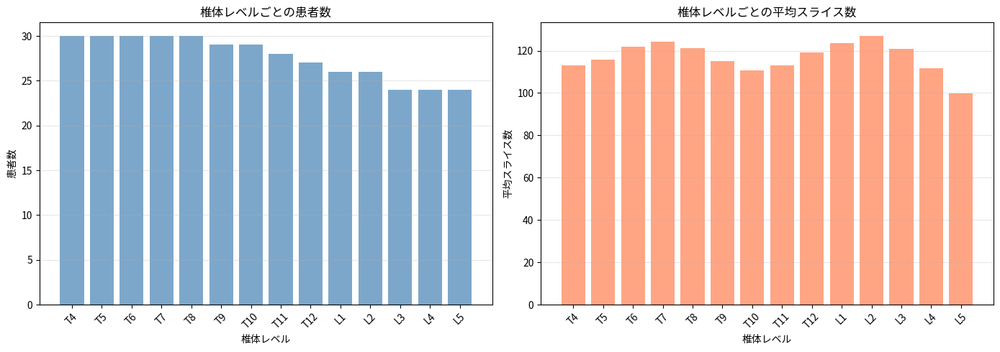

In [4]:
def analyze_vertebra_level_statistics(data_dir: Path, direction: str = "axial") -> pd.DataFrame:
    """
    椎体レベルごとの統計情報を取得
    
    Returns:
        統計情報のDataFrame
    """
    dir_path = data_dir / direction
    stats = defaultdict(lambda: {"patients": set(), "total_slices": 0, "slice_counts": []})
    
    for patient_dir in dir_path.iterdir():
        if not patient_dir.is_dir():
            continue
        
        for vertebra_dir in patient_dir.iterdir():
            if not vertebra_dir.is_dir():
                continue
            
            vertebra_id = vertebra_dir.name
            slice_files = list(vertebra_dir.glob("slice_*.nii"))
            n_slices = len(slice_files)
            
            stats[vertebra_id]["patients"].add(patient_dir.name)
            stats[vertebra_id]["total_slices"] += n_slices
            stats[vertebra_id]["slice_counts"].append(n_slices)
    
    # DataFrameに変換
    data = []
    for vertebra_id in sorted(stats.keys(), key=lambda x: int(x) if x.isdigit() else 999):
        s = stats[vertebra_id]
        data.append({
            "椎体ID": vertebra_id,
            "椎体名": VERTEBRA_MAPPING.get(vertebra_id, vertebra_id),
            "患者数": len(s["patients"]),
            "総スライス数": s["total_slices"],
            "平均スライス数": np.mean(s["slice_counts"]),
            "最小スライス数": np.min(s["slice_counts"]),
            "最大スライス数": np.max(s["slice_counts"])
        })
    
    return pd.DataFrame(data)

# 統計情報を取得
vertebra_stats = analyze_vertebra_level_statistics(SLICE_TRAIN, "axial")

print("【椎体レベル統計 (横断面)】")
print(vertebra_stats.to_string(index=False))

# 可視化
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 患者数
axes[0].bar(vertebra_stats["椎体名"], vertebra_stats["患者数"], color='steelblue', alpha=0.7)
axes[0].set_xlabel("椎体レベル")
axes[0].set_ylabel("患者数")
axes[0].set_title("椎体レベルごとの患者数")
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', alpha=0.3)

# 平均スライス数
axes[1].bar(vertebra_stats["椎体名"], vertebra_stats["平均スライス数"], color='coral', alpha=0.7)
axes[1].set_xlabel("椎体レベル")
axes[1].set_ylabel("平均スライス数")
axes[1].set_title("椎体レベルごとの平均スライス数")
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## 5. 椎体レベルごとのスライス画像サンプル表示

すべての椎体レベル(T4~L5)について、サンプル画像を確認します。

In [5]:
def visualize_vertebra_level_samples(data_dir: Path,
                                      vertebra_ids: List[str],
                                      direction: str = "axial",
                                      n_samples_per_vertebra: int = 3,
                                      hu_preset: str = "bone",
                                      show_mask: bool = True):
    """
    椎体レベルごとにサンプル画像を表示
    
    Args:
        data_dir: データディレクトリ
        vertebra_ids: 椎体IDのリスト
        direction: 方向 (axial/coronal/sagittal)
        n_samples_per_vertebra: 各椎体レベルごとのサンプル数(異なる患者から)
        hu_preset: HU値プリセット
        show_mask: マスク表示
    """
    preset = HU_PRESETS[hu_preset]
    center, width = preset["center"], preset["width"]
    
    n_cols = n_samples_per_vertebra * (2 if show_mask else 1)
    n_rows = len(vertebra_ids)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
    
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    if n_cols == 1:
        axes = axes.reshape(-1, 1)
    
    fig.suptitle(f"椎体レベルごとのスライス画像サンプル - {DIRECTION_NAMES_JP[direction]}\n"
                 f"HU Window: {preset['name']}", fontsize=16, fontweight='bold')
    
    for row_idx, vertebra_id in enumerate(vertebra_ids):
        vertebra_name = VERTEBRA_MAPPING.get(vertebra_id, vertebra_id)
        
        for sample_idx in range(n_samples_per_vertebra):
            col_idx = sample_idx * (2 if show_mask else 1)
            
            # 画像読み込み
            img_path = get_patient_vertebra_slice_path(
                data_dir, direction, vertebra_id, patient_idx=sample_idx
            )
            
            if img_path is None:
                axes[row_idx, col_idx].text(0.5, 0.5, "データなし", 
                                            ha='center', va='center')
                axes[row_idx, col_idx].axis('off')
                if show_mask:
                    axes[row_idx, col_idx + 1].axis('off')
                continue
            
            img_data = load_nifti_slice(img_path)
            img_windowed = apply_hu_window(img_data, center, width)
            
            # 画像表示
            axes[row_idx, col_idx].imshow(img_windowed, cmap='gray')
            patient_id = img_path.parent.parent.name
            axes[row_idx, col_idx].set_title(
                f"{vertebra_name} - {patient_id}\n{img_path.stem}"
            )
            axes[row_idx, col_idx].axis('off')
            
            # マスク表示
            if show_mask:
                mask_filename = img_path.name.replace("slice_", "mask_")
                mask_path = (data_dir / f"{direction}_mask" / patient_id / 
                            vertebra_id / mask_filename)
                
                if mask_path.exists():
                    mask_data = load_nifti_slice(mask_path)
                    axes[row_idx, col_idx + 1].imshow(img_windowed, cmap='gray')
                    axes[row_idx, col_idx + 1].imshow(
                        mask_data, cmap='Reds', alpha=0.5 * (mask_data > 0)
                    )
                    
                    fracture_ratio = np.sum(mask_data > 0) / mask_data.size * 100
                    axes[row_idx, col_idx + 1].set_title(
                        f"Mask (骨折: {fracture_ratio:.1f}%)"
                    )
                else:
                    axes[row_idx, col_idx + 1].text(0.5, 0.5, "マスクなし",
                                                    ha='center', va='center')
                
                axes[row_idx, col_idx + 1].axis('off')
    
    plt.tight_layout()
    plt.show()

print("✅ 可視化関数定義完了")

✅ 可視化関数定義完了


### 5.1 横断面(Axial)での椎体レベルサンプル

表示する椎体レベル: ['T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'T10', 'T11', 'T12', 'L1', 'L2', 'L3', 'L4', 'L5']


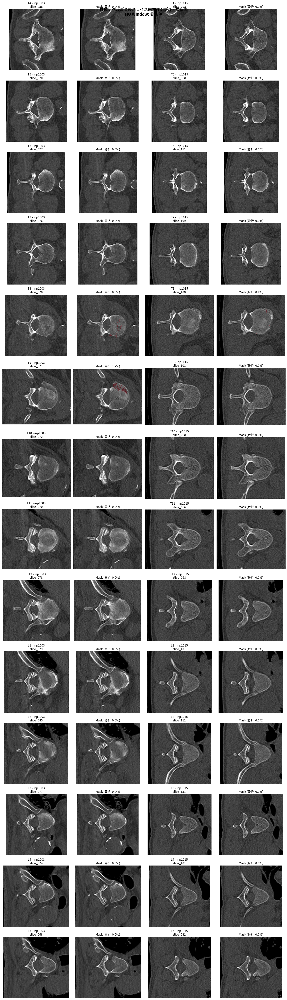

In [6]:
# 対象椎体IDの絞り込み(T4~L5)
target_vertebra_ids_filtered = [vid for vid in TARGET_VERTEBRA_IDS 
                                if vid in vertebra_stats["椎体ID"].values]

print(f"表示する椎体レベル: {[VERTEBRA_MAPPING[vid] for vid in target_vertebra_ids_filtered]}")

# 横断面での表示
visualize_vertebra_level_samples(
    SLICE_TRAIN,
    vertebra_ids=target_vertebra_ids_filtered,
    direction="axial",
    n_samples_per_vertebra=2,
    hu_preset="bone",
    show_mask=True
)

### 5.2 冠状断(Coronal)での椎体レベルサンプル

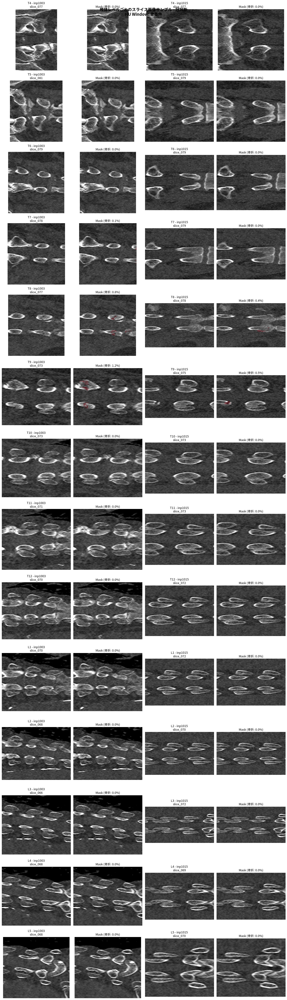

In [7]:
visualize_vertebra_level_samples(
    SLICE_TRAIN,
    vertebra_ids=target_vertebra_ids_filtered,
    direction="coronal",
    n_samples_per_vertebra=2,
    hu_preset="bone",
    show_mask=True
)

### 5.3 矢状断(Sagittal)での椎体レベルサンプル

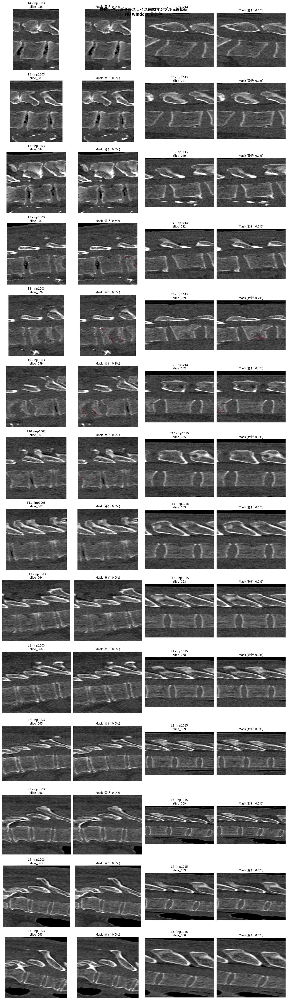

In [8]:
visualize_vertebra_level_samples(
    SLICE_TRAIN,
    vertebra_ids=target_vertebra_ids_filtered,
    direction="sagittal",
    n_samples_per_vertebra=2,
    hu_preset="bone",
    show_mask=True
)

## 6. 特定椎体レベルの3方向比較

特定の椎体レベルについて、axial, coronal, sagittalの3方向を比較します。

In [9]:
def compare_three_directions_for_vertebra(data_dir: Path,
                                           vertebra_id: str,
                                           patient_idx: int = 0,
                                           hu_preset: str = "bone",
                                           show_mask: bool = True):
    """
    特定椎体レベルの3方向比較
    
    Args:
        data_dir: データディレクトリ
        vertebra_id: 椎体ID
        patient_idx: 患者インデックス
        hu_preset: HU値プリセット
        show_mask: マスク表示
    """
    vertebra_name = VERTEBRA_MAPPING.get(vertebra_id, vertebra_id)
    preset = HU_PRESETS[hu_preset]
    center, width = preset["center"], preset["width"]
    
    n_cols = 3
    n_rows = 2 if show_mask else 1
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    
    fig.suptitle(f"椎体 {vertebra_name} の3方向比較\n"
                 f"HU Window: {preset['name']}", fontsize=16, fontweight='bold')
    
    for col_idx, direction in enumerate(DIRECTIONS):
        # 画像読み込み
        img_path = get_patient_vertebra_slice_path(
            data_dir, direction, vertebra_id, patient_idx=patient_idx
        )
        
        if img_path is None:
            axes[0, col_idx].text(0.5, 0.5, "データなし", ha='center', va='center')
            axes[0, col_idx].axis('off')
            if show_mask:
                axes[1, col_idx].axis('off')
            continue
        
        img_data = load_nifti_slice(img_path)
        img_windowed = apply_hu_window(img_data, center, width)
        patient_id = img_path.parent.parent.name
        
        # 画像表示
        axes[0, col_idx].imshow(img_windowed, cmap='gray')
        axes[0, col_idx].set_title(
            f"{DIRECTION_NAMES_JP[direction]}\n{patient_id} - {img_path.stem}"
        )
        axes[0, col_idx].axis('off')
        
        # マスク表示
        if show_mask:
            mask_filename = img_path.name.replace("slice_", "mask_")
            mask_path = (data_dir / f"{direction}_mask" / patient_id / 
                        vertebra_id / mask_filename)
            
            if mask_path.exists():
                mask_data = load_nifti_slice(mask_path)
                axes[1, col_idx].imshow(img_windowed, cmap='gray')
                axes[1, col_idx].imshow(
                    mask_data, cmap='Reds', alpha=0.5 * (mask_data > 0)
                )
                
                fracture_ratio = np.sum(mask_data > 0) / mask_data.size * 100
                axes[1, col_idx].set_title(f"Mask (骨折: {fracture_ratio:.1f}%)")
            else:
                axes[1, col_idx].text(0.5, 0.5, "マスクなし", ha='center', va='center')
            
            axes[1, col_idx].axis('off')
    
    plt.tight_layout()
    plt.show()

print("✅ 3方向比較関数定義完了")

✅ 3方向比較関数定義完了


### 6.1 いくつかの椎体レベルで3方向比較を実行

3方向比較を実行する椎体: ['T4', 'T8', 'T12']

椎体レベル: T4 (ID: 27)


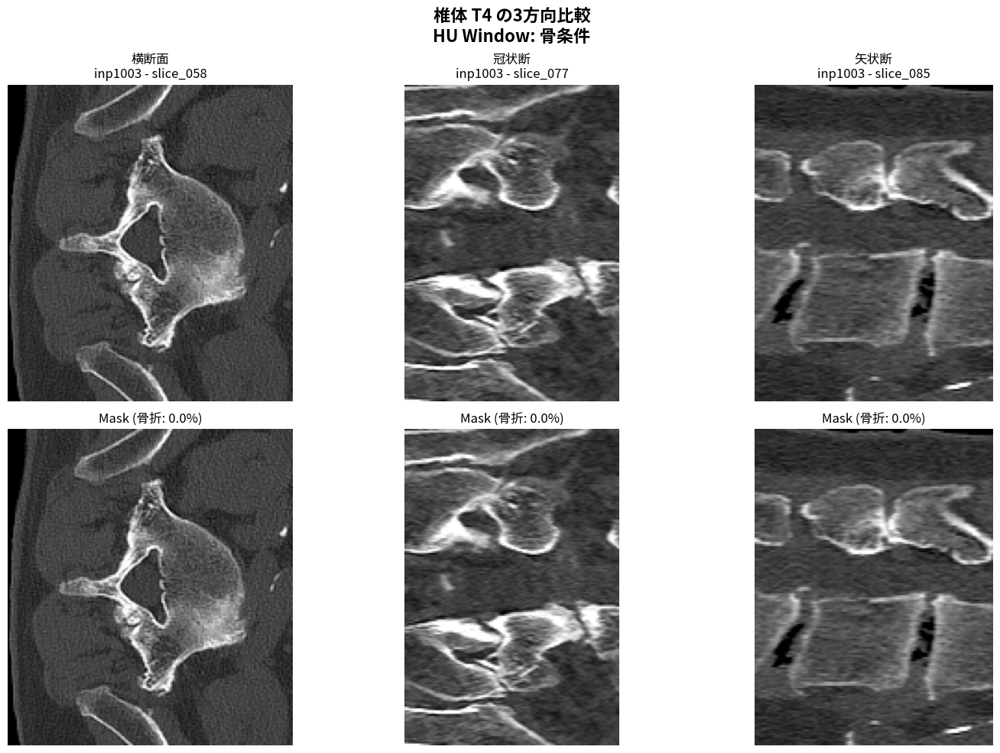


椎体レベル: T8 (ID: 31)


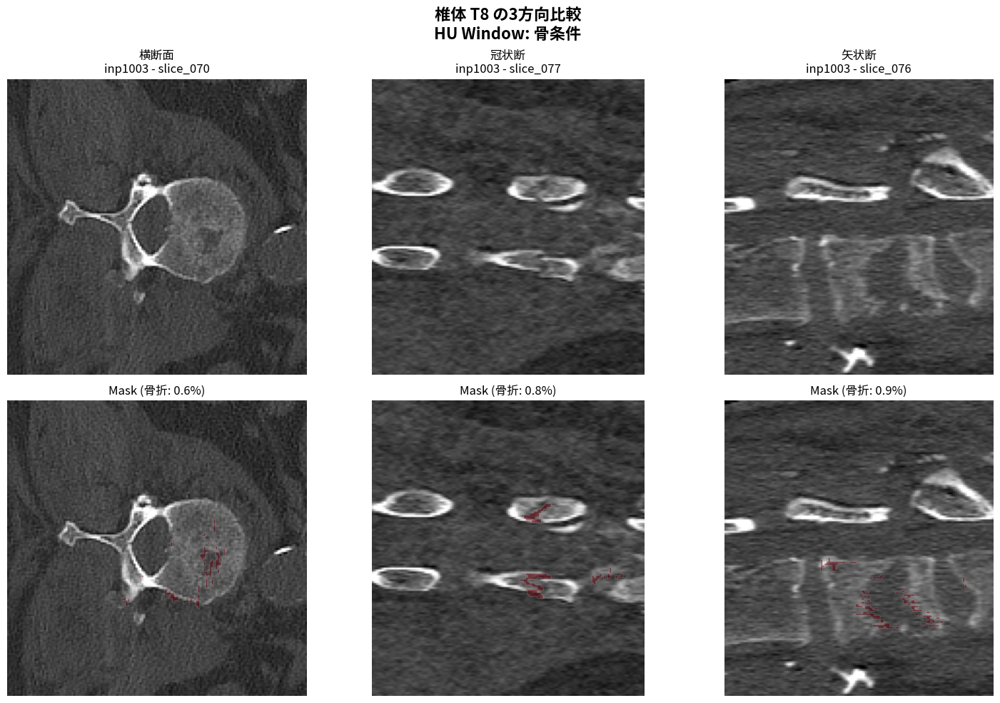


椎体レベル: T12 (ID: 35)


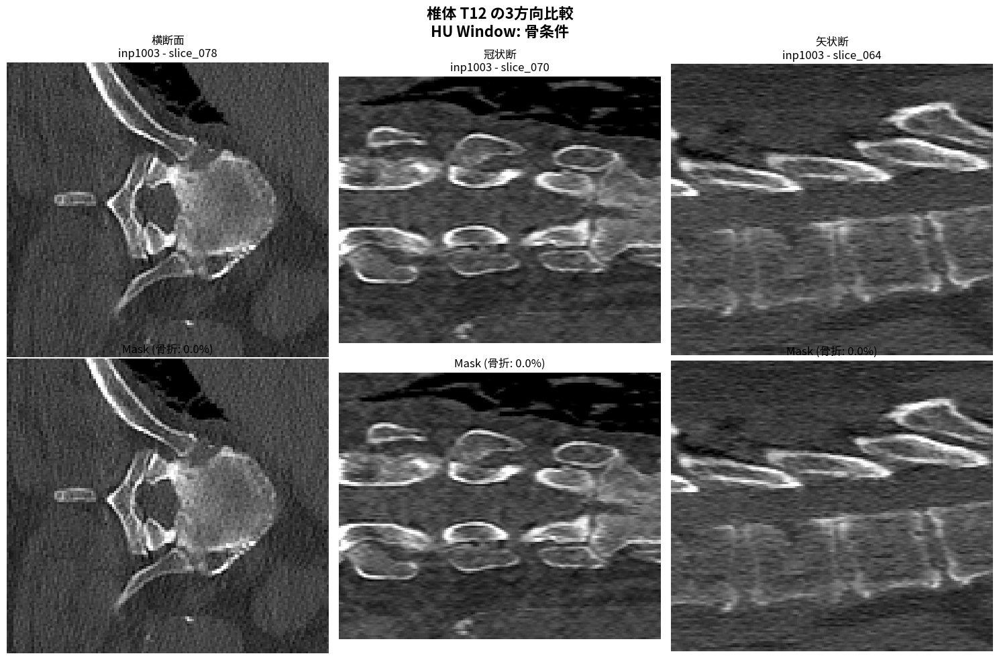

In [10]:
# サンプルとして3つの椎体レベルを選択
sample_vertebrae = target_vertebra_ids_filtered[::len(target_vertebra_ids_filtered)//3][:3]

print(f"3方向比較を実行する椎体: {[VERTEBRA_MAPPING[vid] for vid in sample_vertebrae]}")

for vertebra_id in sample_vertebrae:
    vertebra_name = VERTEBRA_MAPPING[vertebra_id]
    print(f"\n{'='*60}")
    print(f"椎体レベル: {vertebra_name} (ID: {vertebra_id})")
    print('='*60)
    
    compare_three_directions_for_vertebra(
        SLICE_TRAIN,
        vertebra_id=vertebra_id,
        patient_idx=0,
        hu_preset="bone",
        show_mask=True
    )

## 7. 椎体レベルごとの骨折率分析

【椎体レベルごとの骨折率 (横断面)】
椎体ID 椎体名  総スライス数  骨折スライス数    骨折率(%)
  27  T4    3395       99  2.916053
  28  T5    3470      274  7.896254
  29  T6    3657      532 14.547443
  30  T7    3732      652 17.470525
  31  T8    3639      816 22.423743
  32  T9    3334      666 19.976005
  33 T10    3214      359 11.169882
  34 T11    3165      198  6.255924
  35 T12    3217      253  7.864470
  36  L1    3217      321  9.978241
  37  L2    3301      326  9.875795
  38  L3    2898      289  9.972395
  39  L4    2681      164  6.117120
  40  L5    2399       69  2.876198


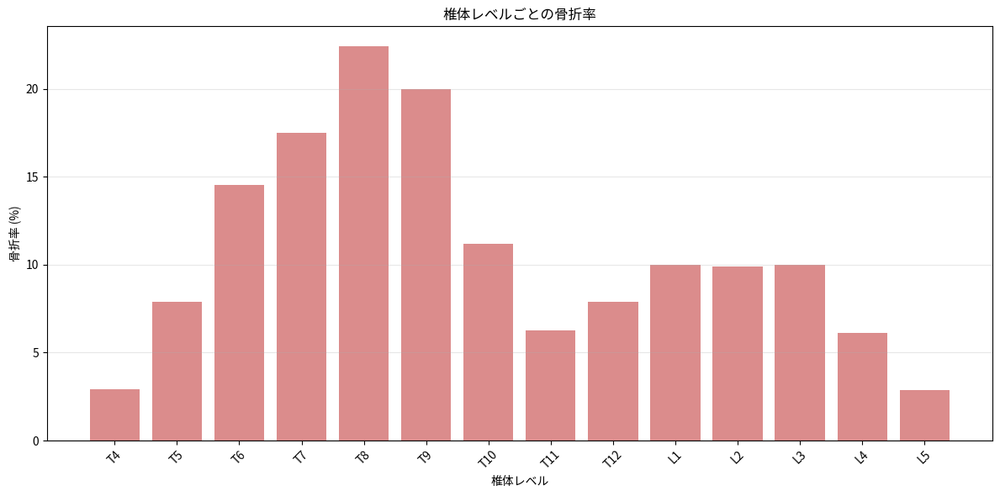

In [11]:
def analyze_fracture_rate_by_vertebra(data_dir: Path, direction: str = "axial") -> pd.DataFrame:
    """
    椎体レベルごとの骨折率を分析
    
    Returns:
        骨折率情報のDataFrame
    """
    mask_dir = data_dir / f"{direction}_mask"
    
    stats = defaultdict(lambda: {"total_slices": 0, "fracture_slices": 0})
    
    for patient_dir in mask_dir.iterdir():
        if not patient_dir.is_dir():
            continue
        
        for vertebra_dir in patient_dir.iterdir():
            if not vertebra_dir.is_dir():
                continue
            
            vertebra_id = vertebra_dir.name
            mask_files = list(vertebra_dir.glob("mask_*.nii"))
            
            for mask_path in mask_files:
                try:
                    mask_data = load_nifti_slice(mask_path)
                    stats[vertebra_id]["total_slices"] += 1
                    
                    if np.any(mask_data > 0):
                        stats[vertebra_id]["fracture_slices"] += 1
                except:
                    continue
    
    # DataFrameに変換
    data = []
    for vertebra_id in sorted(stats.keys(), key=lambda x: int(x) if x.isdigit() else 999):
        s = stats[vertebra_id]
        total = s["total_slices"]
        fracture = s["fracture_slices"]
        
        data.append({
            "椎体ID": vertebra_id,
            "椎体名": VERTEBRA_MAPPING.get(vertebra_id, vertebra_id),
            "総スライス数": total,
            "骨折スライス数": fracture,
            "骨折率(%)": (fracture / total * 100) if total > 0 else 0
        })
    
    return pd.DataFrame(data)

# 骨折率分析
fracture_stats = analyze_fracture_rate_by_vertebra(SLICE_TRAIN, "axial")

print("【椎体レベルごとの骨折率 (横断面)】")
print(fracture_stats.to_string(index=False))

# 可視化
fig, ax = plt.subplots(figsize=(12, 6))

ax.bar(fracture_stats["椎体名"], fracture_stats["骨折率(%)"], 
       color='indianred', alpha=0.7)
ax.set_xlabel("椎体レベル")
ax.set_ylabel("骨折率 (%)")
ax.set_title("椎体レベルごとの骨折率")
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## 8. まとめと観察結果

このノートブックでは、椎体レベル(T4~L5)ごとにスライス画像を体系的に確認しました。

### 確認項目
1. 各椎体レベルのデータ量(患者数、スライス数)
2. 横断面(axial)、冠状断(coronal)、矢状断(sagittal)の3方向での画像品質
3. 骨折マスクの可視化とオーバーレイ表示
4. 椎体レベルごとの骨折率

### 追加の分析
特定の椎体レベルをより詳しく見たい場合は、以下のように関数を実行できます:

```python
# 特定の椎体レベルの3方向比較
compare_three_directions_for_vertebra(
    SLICE_TRAIN,
    vertebra_id="11",  # T4の椎体ID(適宜調整)
    patient_idx=0,
    hu_preset="bone"
)

# 特定の椎体レベルのサンプル表示
visualize_vertebra_level_samples(
    SLICE_TRAIN,
    vertebra_ids=["11", "12", "13"],  # 興味のある椎体ID
    direction="axial",
    n_samples_per_vertebra=3
)
```

## 9. カスタム分析セル

以下のセルを使って、自由に探索的分析を実行できます。

In [ ]:
# カスタム分析用のセル
# 例: 特定の椎体レベルの詳細確認

# 椎体IDを確認
print("利用可能な椎体ID:")
for vid in TARGET_VERTEBRA_IDS:
    print(f"  {vid} → {VERTEBRA_MAPPING[vid]}")

# ここにカスタムコードを追加